### Install libraries
<font color='red'>**Make sure to restart the Colab runtime after installation**</font>

Colab Menu -> Runtime -> Restart runtime

In [ ]:
#!pip install open_clip_torch==2.23.0 transformers==4.35.2 matplotlib

In [62]:
import torch
from urllib.request import urlopen
from PIL import Image
import glob
from pathlib import Path
from torchvision import transforms
from pydicom import dcmread
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


## Load BiomedCLIP model

In [124]:
from open_clip import create_model_from_pretrained, get_tokenizer # works on open-clip-torch>=2.23.0, timm>=0.9.8

model, preprocess = create_model_from_pretrained('hf-hub:microsoft/BiomedCLIP-PubMedBERT_256-vit_base_patch16_224')
tokenizer = get_tokenizer('hf-hub:microsoft/BiomedCLIP-PubMedBERT_256-vit_base_patch16_224')

/gpfs3/well/papiez/users/hri611/python/foundation-models-radiology/env/lib/python3.10/site-packages/huggingface_hub/file_download.py:797: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


# Inference on my images

In [125]:
# preprocess = transforms.Compose([
#     transforms.Resize((224, 224)),
#     transforms.ToTensor(),
#     transforms.Normalize(mean=[0.5]*3, std=[0.5]*3)  # For RGB input
# ])
def load_dicom_image(path,preprocess):
    dicom_file = dcmread(path)
    img_array = dicom_file.pixel_array.astype(np.float32)

    # Normalize pixel values to 0-255
    img_array -= img_array.min()
    img_array /= img_array.max()
    img_array *= 255
    img_array = img_array.astype(np.uint8)

    # Convert to RGB PIL Image
    if len(img_array.shape) == 2:  # grayscale
        img = Image.fromarray(img_array).convert("RGB")
    elif len(img_array.shape) == 3 and img_array.shape[2] == 3:
        img = Image.fromarray(img_array)
    else:
        raise ValueError(f"Unsupported DICOM image shape: {img_array.shape}")

    return preprocess(img)

In [126]:
root_dir = Path('/well/papiez/users/hri611/python/foundation-models-radiology')

dicom_paths = glob.glob(str(root_dir / 'PTX Head to Head Study Data' / '**/*.dcm'), recursive=True)

images = torch.stack([load_dicom_image(path,preprocess) for path in dicom_paths]).to(device)

In [ ]:
dicom_file = dcmread(dicom_paths[20])
img_array = dicom_file.pixel_array.astype(np.float32)

In [115]:
img_array.shape

(2759, 2724)

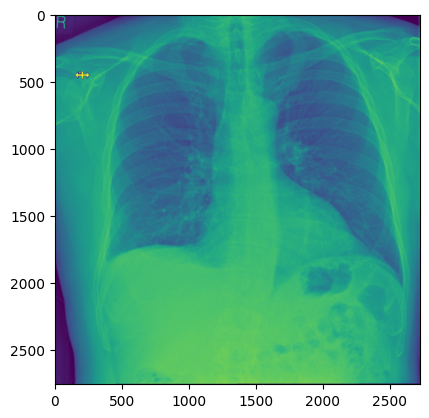

In [116]:
plt.imshow(img_array)

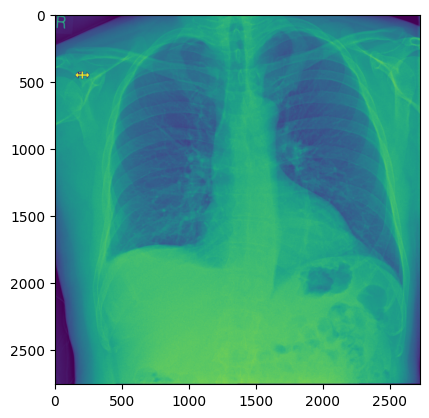

In [117]:
    img_array -= img_array.min()
    img_array /= img_array.max()
    img_array *= 255
    img_array = img_array.astype(np.uint8)

    plt.imshow(img_array)

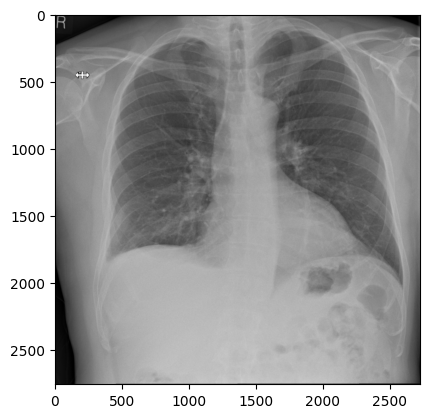

In [118]:
    if len(img_array.shape) == 2:  # grayscale
        img = Image.fromarray(img_array).convert("RGB")
    elif len(img_array.shape) == 3 and img_array.shape[2] == 3:
        img = Image.fromarray(img_array)
    else:
        raise ValueError(f"Unsupported DICOM image shape: {img_array.shape}")
    
plt.imshow(img)

In [119]:
preprocess

Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=True)
    CenterCrop(size=(224, 224))
    <function _convert_to_rgb at 0x7fcbc9528040>
    ToTensor()
    Normalize(mean=[0.48145466, 0.4578275, 0.40821073], std=[0.26862954, 0.26130258, 0.27577711])
)

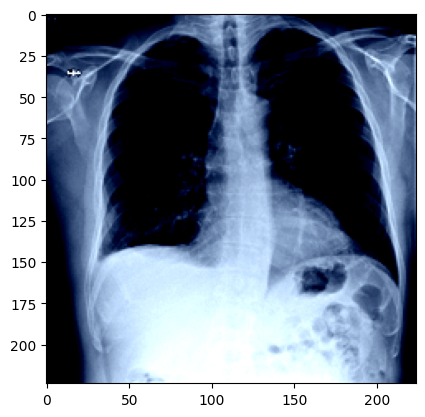

In [120]:
processed_img = preprocess(img)
plt.imshow(processed_img.permute(1, 2, 0).cpu().numpy())

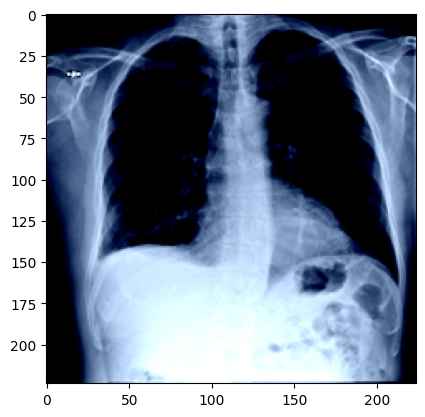

In [123]:
other_preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.48145466, 0.4578275, 0.40821073], std=[0.26862954, 0.26130258, 0.27577711])
])
processed_img = other_preprocess(img)
plt.imshow(processed_img.permute(1, 2, 0).cpu().numpy())

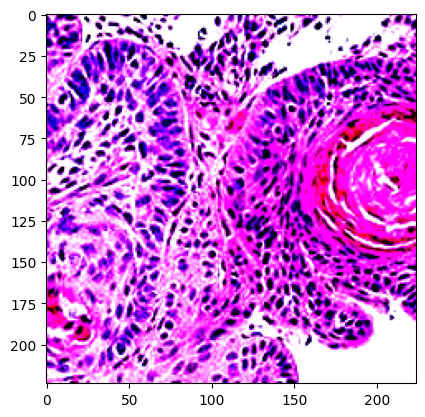

In [113]:
example_array = images[0].cpu().detach().numpy()
plt.imshow(example_array.transpose(1, 2, 0))

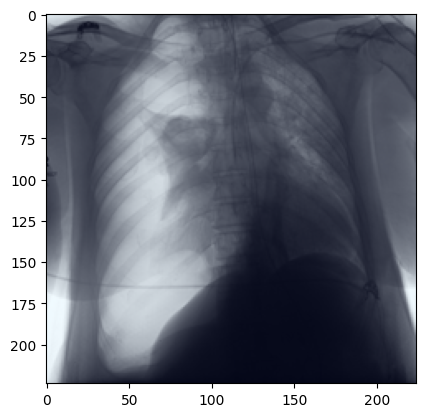

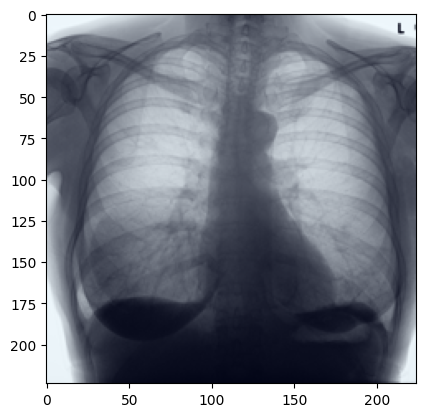

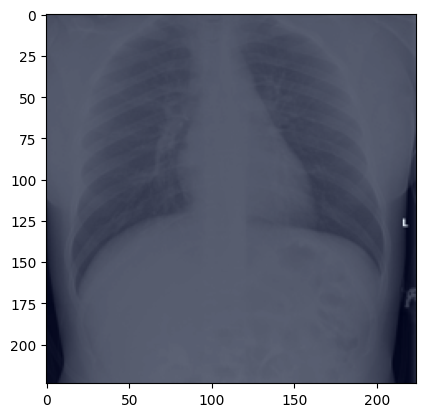

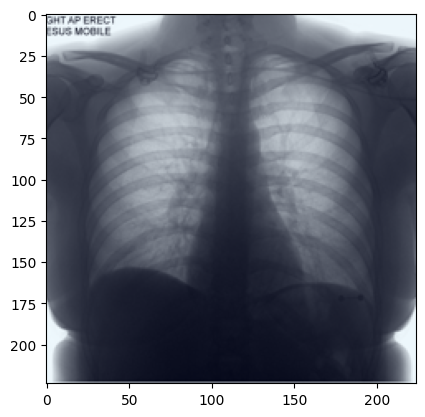

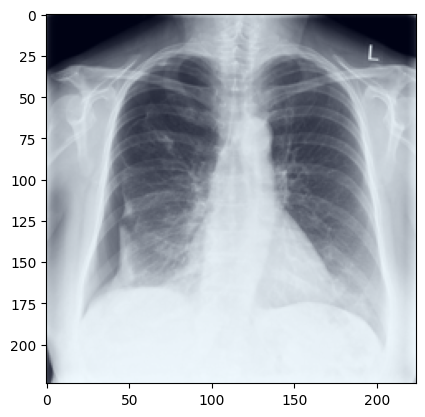

...

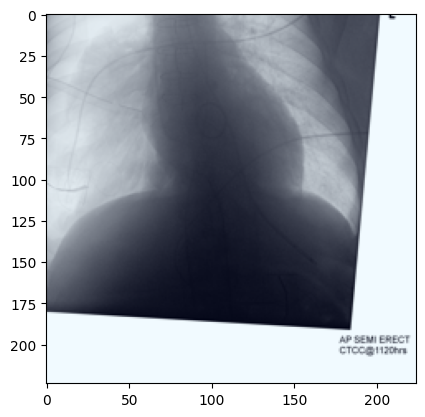

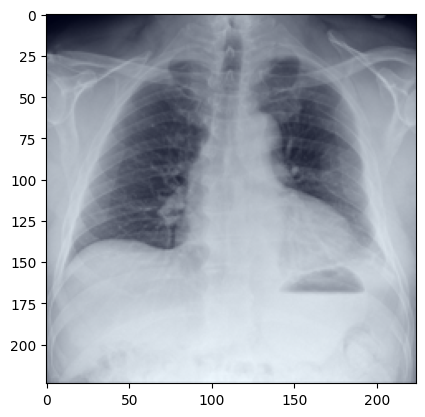

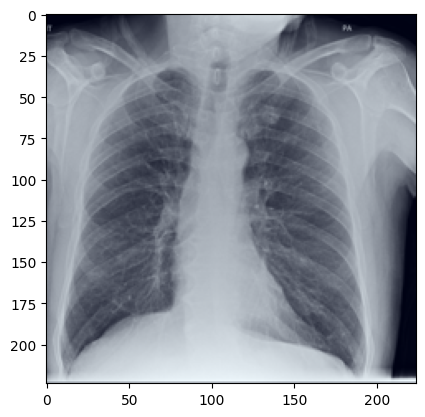

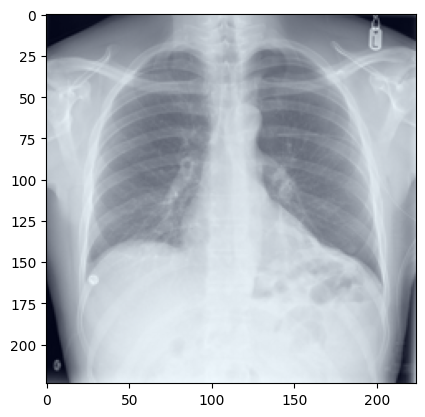

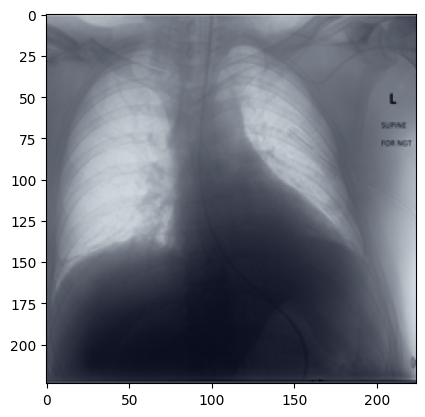

In [133]:
for i in range(50):
    example_array = images[i].cpu().detach().numpy()
    example_array = (example_array - example_array.min()) / (example_array.max() - example_array.min())

    plt.imshow(example_array.transpose(1, 2, 0))
    
    plt.show()

In [132]:
images[0]

tensor([[[ 1.7260,  1.7406,  1.7552,  ...,  0.8938,  0.9814,  1.0690],
         [ 1.6238,  1.6238,  1.6092,  ...,  0.7625,  0.8647,  0.9522],
         [ 1.6092,  1.5946,  1.5654,  ...,  0.6603,  0.7333,  0.8209],
         ...,
         [ 1.7552,  1.6676,  1.5216,  ..., -1.0769, -0.9893, -0.9018],
         [ 1.7260,  1.5800,  1.4486,  ..., -1.1353, -1.0769, -0.9893],
         [ 1.6530,  1.4632,  1.3756,  ..., -1.2229, -1.2083, -1.1207]],

        [[ 1.8648,  1.8798,  1.8948,  ...,  1.0093,  1.0994,  1.1894],
         [ 1.7597,  1.7597,  1.7447,  ...,  0.8743,  0.9793,  1.0694],
         [ 1.7447,  1.7297,  1.6997,  ...,  0.7692,  0.8442,  0.9343],
         ...,
         [ 1.8948,  1.8047,  1.6547,  ..., -1.0167, -0.9267, -0.8366],
         [ 1.8648,  1.7147,  1.5796,  ..., -1.0767, -1.0167, -0.9267],
         [ 1.7897,  1.5946,  1.5046,  ..., -1.1668, -1.1518, -1.0617]],

        [[ 1.9468,  1.9610,  1.9753,  ...,  1.1363,  1.2216,  1.3069],
         [ 1.8473,  1.8473,  1.8331,  ...,  1

In [131]:
example_images[2]

tensor([[[-1.6463, -1.6755, -1.7193,  ..., -0.1572,  0.9230,  1.3172],
         [-1.6463, -1.6755, -1.7193,  ..., -0.1864,  0.9084,  1.3172],
         [-1.6463, -1.6755, -1.7193,  ..., -0.2448,  0.8647,  1.3026],
         ...,
         [-1.7631, -1.7923, -1.1061,  ..., -1.7631, -1.7631, -1.7777],
         [-1.7631, -1.7923, -1.1061,  ..., -1.7631, -1.7631, -1.7777],
         [-1.7631, -1.7923, -1.1061,  ..., -1.7631, -1.7631, -1.7777]],

        [[-1.6020, -1.6320, -1.6771,  ..., -0.0712,  1.0393,  1.4446],
         [-1.6020, -1.6320, -1.6771,  ..., -0.1012,  1.0243,  1.4446],
         [-1.6020, -1.6320, -1.6771,  ..., -0.1613,  0.9793,  1.4295],
         ...,
         [-1.7221, -1.7521, -1.0467,  ..., -1.7221, -1.7221, -1.7371],
         [-1.7221, -1.7521, -1.0467,  ..., -1.7221, -1.7221, -1.7371],
         [-1.7221, -1.7521, -1.0467,  ..., -1.7221, -1.7221, -1.7371]],

        [[-1.3380, -1.3665, -1.4091,  ...,  0.1124,  1.1647,  1.5487],
         [-1.3380, -1.3665, -1.4091,  ...,  0

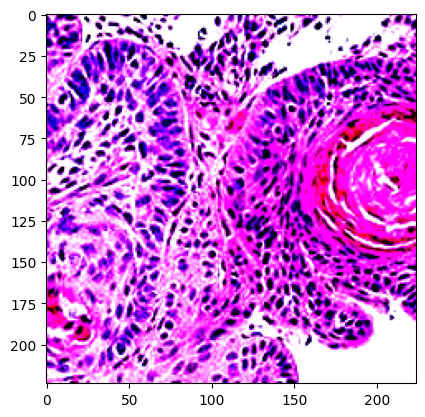

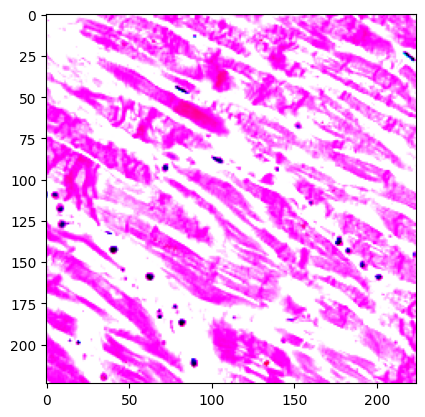

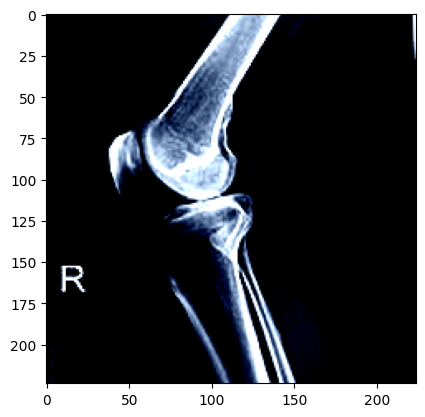

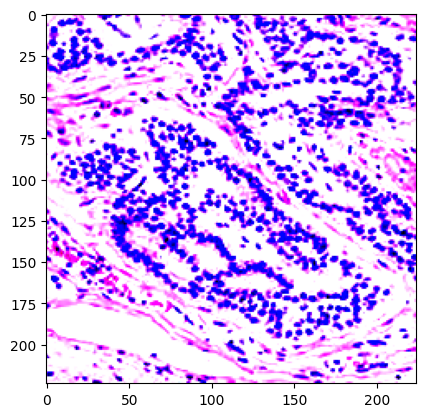

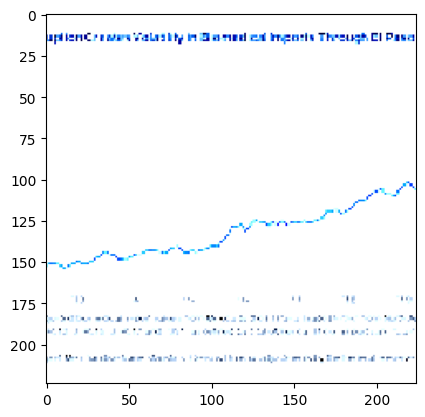

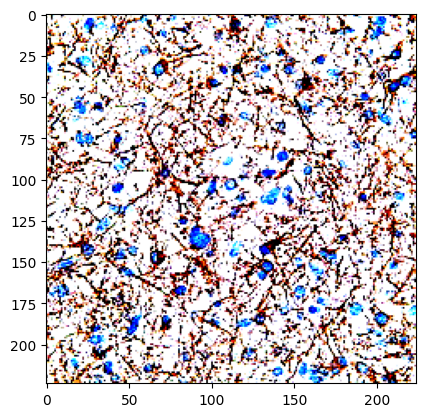

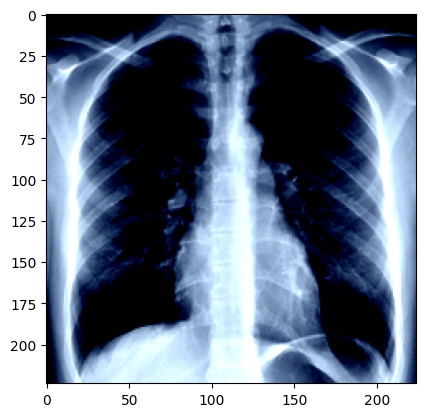

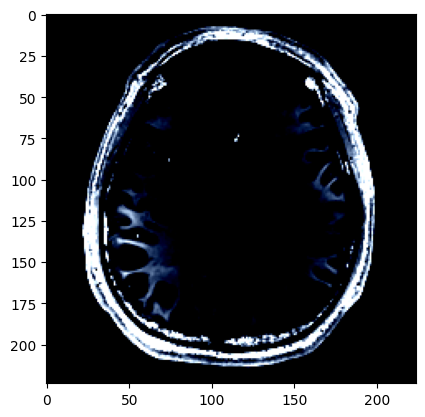

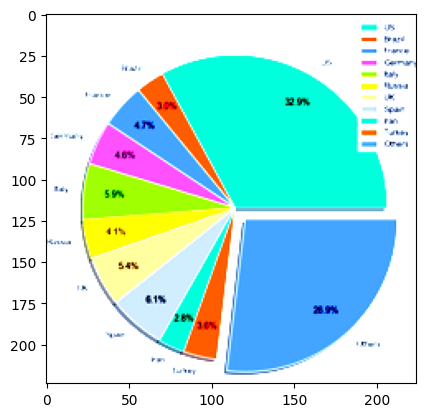

In [130]:
for i in range(len(example_images)):
    example_array = example_images[i].cpu().detach().numpy()
    plt.imshow(example_array.transpose(1, 2, 0))
    
    plt.show()

In [66]:
template = ''
labels = [
    'pneumothorax',
    'no pneumothorax'
]

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)
model.eval()

context_length = 256

texts = tokenizer([template + l for l in labels], context_length=context_length).to(device)

with torch.no_grad():
    image_features, text_features, logit_scale = model(images, texts)
    logits = (logit_scale * image_features @ text_features.t()).detach().softmax(dim=-1)
    logits = logits.cpu().numpy()


In [67]:
image_embeddings_df = pd.DataFrame()
image_embeddings_df['image_paths'] = dicom_paths
image_embeddings_df['image_paths'] = image_embeddings_df['image_paths'].apply(lambda x: x.replace((str(root_dir)+'/PTX Head to Head Study Data/'), ''))
image_embeddings_df['score'] = logits[:, 0]
image_embeddings_df['binary_score'] = image_embeddings_df['score'].apply(lambda x: 1 if x >= 0.5 else 0)

(array([82., 77., 57., 49., 31., 39., 19., 17., 21., 21.]),
 array([0.00659637, 0.10553056, 0.20446475, 0.30339894, 0.40233314,
        0.50126731, 0.60020155, 0.69913572, 0.79806989, 0.89700413,
        0.9959383 ]),
 <BarContainer object of 10 artists>)

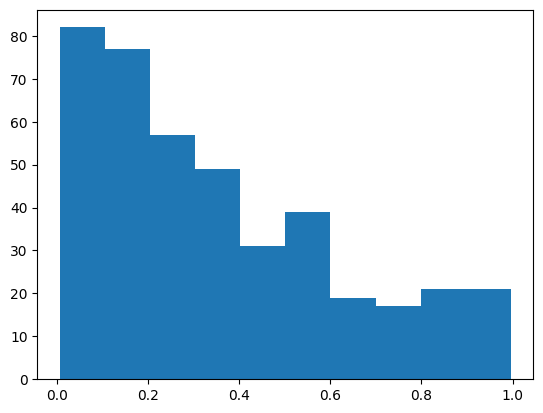

In [68]:
plt.hist(image_embeddings_df['score'])

In [72]:
image_embeddings_df.to_csv('ptx_biomedclip_scores.csv', index=False)

### Example: Zero-shot classifications

In [129]:
import torch
from urllib.request import urlopen
from PIL import Image

template = 'this is a photo of '
labels = [
    'adenocarcinoma histopathology',
    'brain MRI',
    'covid line chart',
    'squamous cell carcinoma histopathology',
    'immunohistochemistry histopathology',
    'bone X-ray',
    'chest X-ray',
    'pie chart',
    'hematoxylin and eosin histopathology'
]

dataset_url = 'https://huggingface.co/microsoft/BiomedCLIP-PubMedBERT_256-vit_base_patch16_224/resolve/main/example_data/biomed_image_classification_example_data/'
test_imgs = [
    'squamous_cell_carcinoma_histopathology.jpeg',
    'H_and_E_histopathology.jpg',
    'bone_X-ray.jpg',
    'adenocarcinoma_histopathology.jpg',
    'covid_line_chart.png',
    'IHC_histopathology.jpg',
    'chest_X-ray.jpg',
    'brain_MRI.jpg',
    'pie_chart.png'
]
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)
model.eval()

context_length = 256

example_images = torch.stack([preprocess(Image.open(urlopen(dataset_url + img))) for img in test_imgs]).to(device)
texts = tokenizer([template + l for l in labels], context_length=context_length).to(device)
with torch.no_grad():
    image_features, text_features, logit_scale = model(images, texts)

    logits = (logit_scale * image_features @ text_features.t()).detach().softmax(dim=-1)
    sorted_indices = torch.argsort(logits, dim=-1, descending=True)

    logits = logits.cpu().numpy()
    sorted_indices = sorted_indices.cpu().numpy()

top_k = -1

for i, img in enumerate(test_imgs):
    pred = labels[sorted_indices[i][0]]

    top_k = len(labels) if top_k == -1 else top_k
    print(img.split('/')[-1] + ':')
    for j in range(top_k):
        jth_index = sorted_indices[i][j]
        print(f'{labels[jth_index]}: {logits[i][jth_index]}')
    print('\n')

squamous_cell_carcinoma_histopathology.jpeg:
chest X-ray: 0.9617986679077148
bone X-ray: 0.03820125386118889
pie chart: 2.4550875110662673e-08
hematoxylin and eosin histopathology: 1.7531569085349474e-08
brain MRI: 3.700263428996209e-09
covid line chart: 3.222555555737472e-09
adenocarcinoma histopathology: 1.967340068631529e-09
immunohistochemistry histopathology: 3.123310776675936e-10
squamous cell carcinoma histopathology: 2.2229416658109402e-12


H_and_E_histopathology.jpg:
chest X-ray: 0.9996621608734131
bone X-ray: 0.00033787055872380733
brain MRI: 1.5907660966263393e-08
covid line chart: 8.722876865263629e-10
hematoxylin and eosin histopathology: 4.749597937170336e-10
pie chart: 3.801479686593723e-10
adenocarcinoma histopathology: 2.453346727160355e-11
immunohistochemistry histopathology: 6.001529568450126e-12
squamous cell carcinoma histopathology: 3.3126277328848763e-12


bone_X-ray.jpg:
chest X-ray: 0.9998377561569214
bone X-ray: 0.00016147854330483824
hematoxylin and eosin hi